In [13]:
%matplotlib inline
import matplotlib.pyplot as plt
import csv
import numpy as np
import pandas as pd

### 讀入資料

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import csv
import numpy as np

f = open('ds/namesex_data_v2.csv', 'r', encoding='utf8')
mydata = csv.DictReader(f)
sexlist = []
namelist = []
foldlist = []
for i, arow in enumerate(mydata):
#     if i < 10:
#         print(arow)
    sexlist.append(int(arow['sex'].strip()))
    gname = arow['gname'].strip()
    namelist.append(gname)
    foldlist.append(int(arow['fold'].strip()))

sexlist = np.asarray(sexlist)
namelist = np.asarray(namelist)
foldlist = np.asarray(foldlist)
f.close()

### 將資料轉成DataFrame

In [4]:
name_df = pd.DataFrame({'sex': sexlist, 'name': namelist, 'fold': foldlist})
sex_tend = name_df[['name', 'sex']].groupby(["name"]).agg(['mean', 'count']).reset_index()
sex_tend.columns = ['-'.join(col).strip() for col in sex_tend.columns.values]
sex_tend = sex_tend.sort_values(['sex-count'], ascending=False)

In [5]:
def push_into_dict(origin_dict, key):
    if key not in origin_dict:
        origin_dict[key] = 1
    else:
        origin_dict[key] += 1        

def gen_feature(data, name):
    count_dict = {}
    for i in range(len(name)):
        if len(name[i]) ==2:
            a = name[i][0] # 名字的第一個字
            b = name[i][1] 
            c = name[i]
            push_into_dict(count_dict, a)
            push_into_dict(count_dict, b)
            push_into_dict(count_dict, c)
        elif len(name[i]) ==1:
            push_into_dict(count_dict, name[i])

    final_list = []
    for key, value in count_dict.items():
        if (value >= 2):
            final_list.append(key)
    return final_list
    
def one_hot(data, name, final_list):
    shape = (len(name), len(final_list))
    new_data = np.zeros((shape))
    for i in range(shape[0]):
        for j in range(shape[1]):
            if final_list[j] in name[i]:
                new_data[i][j] = 1

    data.reset_index(drop = True,inplace = True)
    data = pd.concat([data, pd.DataFrame(new_data)], axis = 1)

    data = data.drop(columns=['name'])
    other_feature = []
    for i in range(shape[0]):
        name_len = len(name[i])
        sum_x = new_data[i, :].sum()
        if name_len == 2 and sum_x==3:
            other_feature.append(0)
        elif name_len == 1 and sum_x==1:
            other_feature.append(0)
        else:
            other_feature.append(1)
    data['other_feature'] = other_feature
    data = np.array(data)
    return data

In [6]:
# Training (fold <= 6)

training = name_df[name_df['fold'] <= 6]
y_train = np.array(training['sex'])
training = training.drop(columns=['sex', 'fold'])
name = training['name'].tolist()

feature = gen_feature(training, name)
x_train = one_hot(training, name, feature)

print(x_train.shape)
print(y_train.shape)

(7483, 1630)
(7483,)


In [7]:
# Validation (fold == 7)
fold_7 = name_df[name_df['fold'] == 7]
y_valid = np.array(fold_7['sex'])
fold_7 = fold_7.drop(columns=['sex', 'fold'])
name = fold_7['name'].tolist()


x_valid = one_hot(fold_7, name, feature)
print(x_valid.shape)
print(y_valid.shape)

(1110, 1630)
(1110,)


In [8]:
# Stacking (fold == 8)
fold_8 = name_df[name_df['fold'] == 8]
y_stack = np.array(fold_8['sex'])
fold_8 = fold_8.drop(columns=['sex', 'fold'])
name = fold_8['name'].tolist()
x_stack = one_hot(fold_8, name, feature)
print(x_stack.shape)
print(y_stack.shape)

(1073, 1630)
(1073,)


In [9]:
# Stacking (fold == 9)
fold_9 = name_df[name_df['fold'] == 9]
y_test = np.array(fold_9['sex'])
fold_9 = fold_9.drop(columns=['sex', 'fold'])
name = fold_9['name'].tolist()
x_test = one_hot(fold_9, name, feature)
print(x_test.shape)

(1064, 1630)


In [10]:
feature.append('other_feature')

### Q1.2

In [16]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
import warnings
warnings.filterwarnings('ignore')

c_list = np.logspace(-4,3,20)
f1_max = -100
# 計算best c
for c in c_list:
    lr = LogisticRegression(C = c)
    lr.fit(x_train, y_train)
    y_pred = lr.predict(x_valid)
    score = f1_score(y_valid, y_pred)
    if score > f1_max:
        f1_max = score
        best_c = c
        
# 拿best c fit 一個好model
lr = LogisticRegression(C = best_c)
x_tv = np.vstack((x_train, x_valid))
y_tv = np.hstack((y_train, y_valid))
lr.fit(x_tv, y_tv)
y_pred = lr.predict(x_test)

f_score = f1_score(y_test, y_pred)
p_score = precision_score(y_test, y_pred)
r_score = recall_score(y_test, y_pred)
acc = accuracy_score(y_test, y_pred)

In [13]:
coef = abs(lr.coef_)
coef_index = coef.argsort()[0][-20:]
sig_coef = lr.coef_[0][coef_index]
important_feature = np.array(feature)[coef_index]

print(f'f_score: {f_score} \np_score:{p_score} \nr_score:{r_score} \naccuracy:{acc}')
for i in range(20):
    print(f'feature:{important_feature[i]}, importance score:{sig_coef[i]}')

print('由於大部分重要的特徵之係數多為負號，代表名次出現此類關鍵字，容易為女性。顯然地，名字出現如妍玲柔等等為女性機率很高(符合常理)')

f_score: 0.8806419257773321 
p_score:0.8607843137254902 
r_score:0.9014373716632443 
accuracy:0.8881578947368421
feature:妍, importance score:-5.140794505764401
feature:森, importance score:5.15619395751967
feature:玲, importance score:-5.170925290216893
feature:柔, importance score:-5.257090604259633
feature:綺, importance score:-5.268960360602653
feature:綾, importance score:-5.287096154283063
feature:薇, importance score:-5.312020473976459
feature:凌, importance score:-5.390003894102237
feature:婕, importance score:-5.466855768396354
feature:美, importance score:-5.477529459963158
feature:姿, importance score:-5.485381513904781
feature:靜, importance score:-5.556925793334759
feature:蓉, importance score:-5.566001222403227
feature:琳, importance score:-5.6035852413948435
feature:潔, importance score:-5.816078635620414
feature:萱, importance score:-5.943989505408715
feature:雯, importance score:-5.959426370154681
feature:婷, importance score:-5.977900336706824
feature:傑, importance score:6.129458654956

### Q1.3

In [17]:
from sklearn.ensemble import RandomForestClassifier

tree_num = np.logspace(1,3,10)
f1_max = -100
# 計算best c
for n in tree_num:
    RFC = RandomForestClassifier(n_estimators = int(n))
    RFC.fit(x_train, y_train)
    y_pred = RFC.predict(x_valid)
    score = f1_score(y_valid, y_pred)
    if score > f1_max:
        f1_max = score
        best_n = int(n)
        
# 拿best n fit 一個好model
RFC = RandomForestClassifier(n_estimators = best_n)
x_tv = np.vstack((x_train, x_valid))
y_tv = np.hstack((y_train, y_valid))
RFC.fit(x_tv, y_tv)
y_pred = RFC.predict(x_test)

f_score = f1_score(y_test, y_pred)
p_score = precision_score(y_test, y_pred)
r_score = recall_score(y_test, y_pred)
acc = accuracy_score(y_test, y_pred)

In [57]:
importance = abs(RFC.feature_importances_)
important_index = importance.argsort()[-20:]
sig_importance = RFC.feature_importances_[important_index]
important_feature = np.array(feature)[important_index]

print(f'f_score: {f_score} \np_score:{p_score} \nr_score:{r_score} \naccuracy:{acc}')
for i in range(20):
    print(f'feature:{important_feature[i]}, importance score:{sig_importance[i]}')
print('')

f_score: 0.8309859154929577 
p_score:0.814595660749507 
r_score:0.8480492813141683 
accuracy:0.8421052631578947
feature:瑄, importance score:0.007211194037419488
feature:庭, importance score:0.007301338736264345
feature:涵, importance score:0.00742854709152606
feature:晴, importance score:0.008001994758969488
feature:佳, importance score:0.00814634169240258
feature:芸, importance score:0.008226798049853427
feature:芷, importance score:0.008263655583324985
feature:宜, importance score:0.008280944659631083
feature:柔, importance score:0.008376621995705002
feature:蓁, importance score:0.008452440774238401
feature:雅, importance score:0.00849112403667093
feature:other_feature, importance score:0.008594267221525008
feature:承, importance score:0.009252362758624191
feature:怡, importance score:0.009516648219208324
feature:哲, importance score:0.009521863406053743
feature:婷, importance score:0.01320709056949933
feature:萱, importance score:0.013772185616421503
feature:柏, importance score:0.01386743123359162

- RandomForestClassifier的表現稍微有些遜色，是合理的，因為名字所使用的字詞變化非常多、也有一些字詞是男生女生都很常使用的，這些原因會使切割變得困難。
- 大部分重要的特徵為女性常使用的字，名字出現瑄庭涵等等為女性機率很高，符合常理。

### Q1.4

In [18]:
from sklearn.ensemble import GradientBoostingClassifier
learning_rate = [0.1, 0.5, 1]
f1_max = -100
for lr in learning_rate:
    GBC = GradientBoostingClassifier(n_estimators=1500, learning_rate=lr)
    GBC.fit(x_train, y_train)
    y_pred = GBC.predict(x_valid)
    score = f1_score(y_valid, y_pred)
    if score > f1_max:
        f1_max = score
        best_lr = lr

# 拿best n fit 一個好model
GBC = GradientBoostingClassifier(n_estimators = 1500, learning_rate = best_lr)
x_tv = np.vstack((x_train, x_valid))
y_tv = np.hstack((y_train, y_valid))
GBC.fit(x_tv, y_tv)
y_pred = GBC.predict(x_test)

f_score = f1_score(y_test, y_pred)
p_score = precision_score(y_test, y_pred)
r_score = recall_score(y_test, y_pred)
acc = accuracy_score(y_test, y_pred)

In [17]:
importance = abs(GBC.feature_importances_)
important_index = importance.argsort()[-20:]
sig_importance = GBC.feature_importances_[important_index]
important_feature = np.array(feature)[important_index]
print(f'f_score: {f_score} \np_score:{p_score} \nr_score:{r_score} \naccuracy:{acc}')
for i in range(20):
    print(f' feature:{important_feature[i]}, importance score:{sig_importance[i]}')

f_score: 0.8693069306930693 
p_score:0.8393881453154876 
r_score:0.9014373716632443 
accuracy:0.8759398496240601
 feature:慈, importance score:0.00946914028785239
 feature:庭, importance score:0.009652036806419772
 feature:芷, importance score:0.010076997473742879
 feature:瑄, importance score:0.010089947701328901
 feature:涵, importance score:0.010413095679242373
 feature:芸, importance score:0.01051130539145969
 feature:宜, importance score:0.010717256536401891
 feature:柔, importance score:0.01086468480719844
 feature:佳, importance score:0.010866437621922511
 feature:晴, importance score:0.011203574677124408
 feature:雅, importance score:0.011389945281025049
 feature:蓁, importance score:0.011900709779625858
 feature:怡, importance score:0.012034553177096308
 feature:承, importance score:0.012106168554161266
 feature:哲, importance score:0.012123250217828008
 feature:婷, importance score:0.018006043348965994
 feature:柏, importance score:0.01874065095741641
 feature:萱, importance score:0.0190476465

- GradientBoostingClassifier的準確率跟PCA差不多，但重要特徵有些不同。
- 雖然重要特徵跟PCA有些許不同，但仍然可以發現重要特徵中多為女性經常使用的字。

## Q1.5

In [19]:
from sklearn.ensemble import StackingClassifier
estimators = [('lr', LogisticRegression(C = best_c)),
              ('rfc', RandomForestClassifier(n_estimators = best_n)),
              ('gbc', GradientBoostingClassifier(n_estimators = 1500, learning_rate = best_lr))]


stack_model = StackingClassifier(estimators = estimators,
                                 stack_method = 'predict_proba',
                                 final_estimator=LogisticRegression()
                                )


stack_model.fit(x_stack, y_stack)

StackingClassifier(estimators=[('lr', LogisticRegression(C=14.38449888287663)),
                               ('rfc',
                                RandomForestClassifier(n_estimators=129)),
                               ('gbc',
                                GradientBoostingClassifier(n_estimators=1500))],
                   final_estimator=LogisticRegression(),
                   stack_method='predict_proba')

In [21]:
# Stacking分類器在Test資料集的預測能力
stack_acc = stack_model.score(x_test, y_test)
print(f'Accuracy of stacking model = {stack_acc}')

Accuracy of stacking model = 0.856203007518797


In [22]:
# Stacking分類器的係數
stack_model.get_params()

{'cv': None,
 'estimators': [('lr', LogisticRegression(C=14.38449888287663)),
  ('rfc', RandomForestClassifier(n_estimators=129)),
  ('gbc', GradientBoostingClassifier(n_estimators=1500))],
 'final_estimator__C': 1.0,
 'final_estimator__class_weight': None,
 'final_estimator__dual': False,
 'final_estimator__fit_intercept': True,
 'final_estimator__intercept_scaling': 1,
 'final_estimator__l1_ratio': None,
 'final_estimator__max_iter': 100,
 'final_estimator__multi_class': 'auto',
 'final_estimator__n_jobs': None,
 'final_estimator__penalty': 'l2',
 'final_estimator__random_state': None,
 'final_estimator__solver': 'lbfgs',
 'final_estimator__tol': 0.0001,
 'final_estimator__verbose': 0,
 'final_estimator__warm_start': False,
 'final_estimator': LogisticRegression(),
 'n_jobs': None,
 'passthrough': False,
 'stack_method': 'predict_proba',
 'verbose': 0,
 'lr': LogisticRegression(C=14.38449888287663),
 'rfc': RandomForestClassifier(n_estimators=129),
 'gbc': GradientBoostingClassifier(

## 第二題 [Data Visualization via Dimensionality Reduction]

### 讀入資料

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

stu_adm = pd.read_csv('ds/student_admission106.csv', encoding="utf-8", dtype=str)
uname = pd.read_csv('ds/univ_name106short1.csv', encoding="utf-8", dtype=str)

all_depid = stu_adm['department_id'].unique()
all_stuid = stu_adm['student_id'].unique()

ndepid = all_depid.shape[0]
nstuid = all_stuid.shape[0]
print("In raw data, there are %d students and %d departments in total." % (nstuid, ndepid))

#construct the department-student matrix (i.e. array). 
dep_stu = np.zeros((ndepid, nstuid))
rowname = all_depid.copy()

depid_seq_map = dict()
for i in range(ndepid):
    depid_seq_map[all_depid[i]] = i

stuid_seq_map = dict()
for i in range(nstuid):
    stuid_seq_map[all_stuid[i]] = i

for cindex, row in stu_adm.iterrows():
    #print(cindex, row)
    dep_seq = depid_seq_map[row['department_id']]
    stu_seq = stuid_seq_map[row['student_id']]
    #print(dep_seq, stu_seq)
    dep_stu[dep_seq, stu_seq] = 1

#Remove very small departments.
min_stu_per_dep = 10
min_apply_dep_per_stu = 2

#remove small departments and single-application students. 
dep_apply_sum = np.sum(dep_stu, axis = 1)
keeprow = dep_apply_sum >= min_stu_per_dep
rowname = rowname[keeprow]
dep_stu2 = dep_stu[keeprow,:]
stu_apply_sum = np.sum(dep_stu2, axis = 0)
dep_stu2 = dep_stu2[:, stu_apply_sum >= min_apply_dep_per_stu]

#another run of filtering
dep_apply_sum = np.sum(dep_stu2, axis = 1)
dep_stu2 = dep_stu2[dep_apply_sum >= min_stu_per_dep,:]
rowname = rowname[dep_apply_sum >= min_stu_per_dep]
stu_apply_sum = np.sum(dep_stu2, axis = 0)
dep_stu2 = dep_stu2[:, stu_apply_sum >= min_apply_dep_per_stu]

#third run of filtering
dep_apply_sum = np.sum(dep_stu2, axis = 1)
dep_stu2 = dep_stu2[dep_apply_sum >= min_stu_per_dep,:]
rowname = rowname[dep_apply_sum >= min_stu_per_dep]

stu_apply_sum = np.sum(dep_stu2, axis = 0)
dep_stu2 = dep_stu2[:, stu_apply_sum >= min_apply_dep_per_stu]

#check to make sure the two conditions are satisfied. 
dep_apply_sum = np.sum(dep_stu2, axis = 1)
print("Number of department too small:", np.sum(dep_apply_sum < min_stu_per_dep))
stu_apply_sum = np.sum(dep_stu2, axis = 0)
print("Number of students applying only one department:", np.sum(stu_apply_sum <min_apply_dep_per_stu))

#now both conditions are satisfied.

In raw data, there are 60461 students and 1976 departments in total.
Number of department too small: 0
Number of students applying only one department: 0


In [3]:
num_dep, num_stu = dep_stu2.shape
print("In final dataset, there are", num_dep, "academic departments and", num_stu, "student applicants.")

In final dataset, there are 1917 academic departments and 47386 student applicants.


In [4]:
uname['depname'] = uname.school_name_abbr + uname.department_name_abbr
uname2 = uname[['department_id', 'depname', 'category_name']].copy()
#this is for later use, to color data points. 
category_id, category_levels = pd.factorize(uname2.category_name)
#uname2['category_id'] = category_id / np.max(category_id)
uname2['category_id'] = category_id

#create a data frame for column name
colname_df = pd.DataFrame({'department_id': rowname})
colname_df = colname_df.merge(uname2, how = "left", on="department_id")

In [5]:
topdepid = np.argsort(dep_apply_sum)[::-1]
topn = 10
topdep = pd.DataFrame({'department_id': rowname[topdepid[0:topn]], 
                       'department_name': colname_df.depname.values[topdepid[0:topn]],
                       'num_applicant': dep_apply_sum[topdepid[0:topn]]
                       }) 
topdep

,department_id,department_name,num_applicant
0,008122,中原機械工程學,386.0
1,012052,中醫藥學,376.0
2,046032,銘傳會計（臺北）,367.0
3,004382,成大電機,357.0
4,005192,東吳企業管理,353.0
5,008112,中原土木,353.0
6,005182,東吳會計,351.0
7,015342,逢甲財金,340.0
8,045012,義守電機,339.0
9,046162,銘傳應用英語（桃園）,329.0


## 第二題 [Data Visualization via Dimensionality Reduction]

In [11]:
# 設定中文字型
from matplotlib.font_manager import FontProperties
ChineseFont = FontProperties(fname='/opt/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/SimHei.ttf')

# 畫圖用的function
def draw_plot(x, y, name, colors, dpi = 120, fontsize = 6, markersize = 15, title = None):
    x = x*1.0
    y = y*1.0
    
    fig, ax = plt.subplots(dpi = dpi)
    
    if title != None:
        ax.set_title(title)
    ax.scatter(x, y, s = markersize, color = colors, alpha = 0.8)

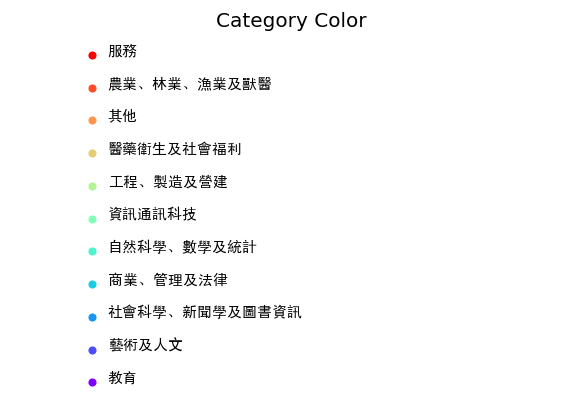

In [12]:
# category_name和category_id對照
category_df = colname_df[['category_name', 'category_id']].copy()
category_df = category_df.drop_duplicates().sort_values(['category_id'])

# 印出每個類別對照的顏色
colors = plt.cm.rainbow(np.linspace(0, 1, category_df.shape[0]))

fig, ax = plt.subplots(dpi = 120)
ax.set_title("Category Color")
ax.set_xlim([-0.5, 3])
for i in range(category_df.shape[0]):
    thecolor = colors[category_df.category_id.values[i]]
    name = category_df.category_name.values[i]    
    x = 0
    y = 2 * i    
    ax.scatter(x, y, s = 15, color = thecolor)    
    ax.annotate(name, (x+0.1, y), fontsize=9,  fontproperties=ChineseFont)
    
    # 關掉座標軸
    ax.set_xticks([])
    ax.set_yticks([])
    
    # 關掉外框
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
plt.show()

### Q2.1 PCA

In [16]:
from sklearn.decomposition import PCA

#PCA using the first 8 components

pca = PCA(n_components=8)
pred_dep = pca.fit_transform(dep_stu2)

depColor = colors[colname_df.category_id.values]

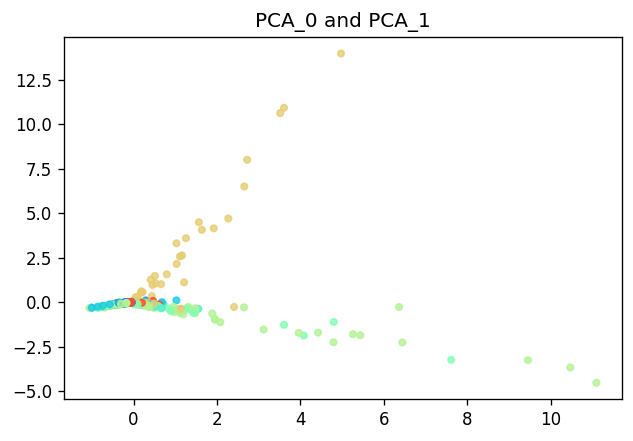

In [63]:
draw_plot(pred_dep[:, 0], pred_dep[:, 1], colname_df['depname'], depColor, title = 'PCA_0 and PCA_1')

- 從PCA_0來看，可以明顯發現工程、製造及營建分佈偏右邊（中間還參雜零星幾個資訊通訊科技），而左邊多為商業、管理及法律。
- 從PCA_1來看，上主要的分類是醫藥衛生與社會福利，下方則沒有明確是哪些分類或趨勢。

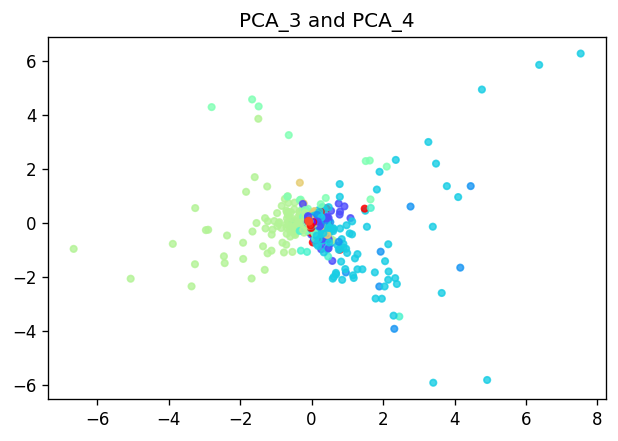

In [69]:
draw_plot(pred_dep[:, 3], pred_dep[:, 4], colname_df['depname'], depColor, title = 'PCA_3 and PCA_4')

- 從PCA_3來看，可以發現左邊主要為工程、製造及營建，右邊則是商業、管理及法律和社會科學、新聞學及圖書資訊。
- 從PCA_4來看並沒有發現明顯的分類趨勢。

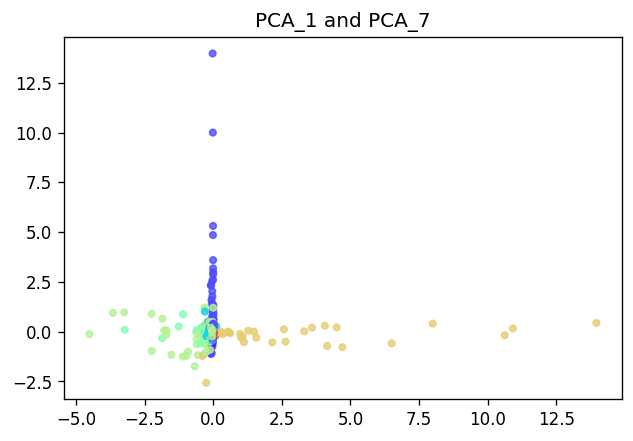

In [82]:
draw_plot(pred_dep[:, 1], pred_dep[:, 7], colname_df['depname'], depColor, title = 'PCA_1 and PCA_7')

- 從PCA_1來看，左邊主要是工程、製造及營建和零星的資訊通訊科技，靠近右方則是醫藥衛生與社會福利。
- 從PCA_7來看，上方主要是藝術及人文類。

### Q2.2 Multiple Dimensional Scaling

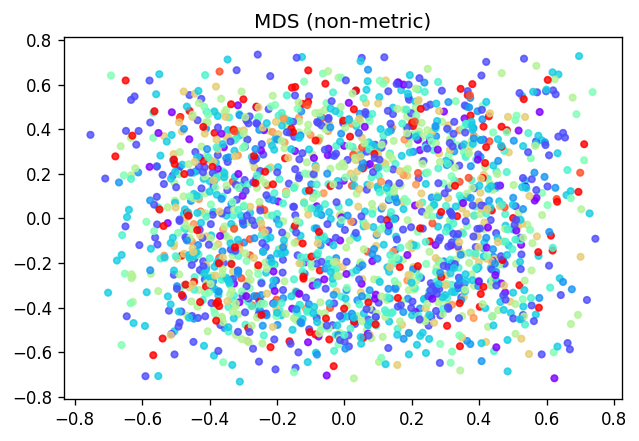

In [84]:
from sklearn.manifold import MDS

# non-metric
mds = MDS(n_components=2, metric = False, n_jobs = -1)
dep_mds = mds.fit_transform(dep_stu2)
draw_plot(dep_mds[:,0], dep_mds[:,1], colname_df['depname'], depColor, title = "MDS (non-metric)")

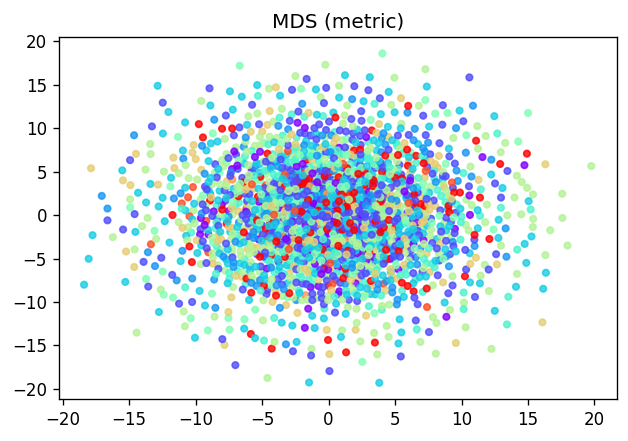

In [85]:
# metric
mds_metric = MDS(n_components=2, metric = True, n_jobs = -1)
dep_mds_metric = mds_metric.fit_transform(dep_stu2)
draw_plot(dep_mds_metric[:,0], dep_mds_metric[:,1], colname_df['depname'], depColor, title = "MDS (metric)")

- 從兩張圖來看，不論是non-metric還是metric都沒有將不同的類別區分開來，類別跟類別之間彼此靠太得太近甚至是重疊在一起，無法看出個所以然。

### Q3.3 Locally Linear Embedding

In [88]:
from sklearn.manifold import LocallyLinearEmbedding

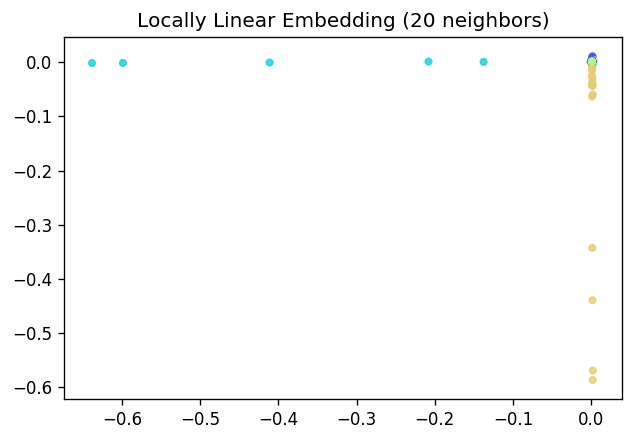

In [90]:
# (1) Use 20 neighbors

lle20= LocallyLinearEmbedding(n_components = 2, n_neighbors = 20, n_jobs = -1)
lle20_dep = lle20.fit_transform(dep_stu2)
draw_plot(lle20_dep[:,0], lle20_dep[:,1], colname_df['depname'], depColor, title = "Locally Linear Embedding (20 neighbors)")

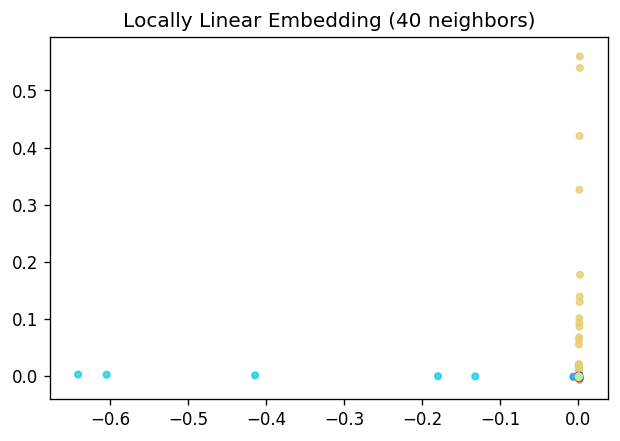

In [93]:
# (2) Use 40 neighbors

lle40= LocallyLinearEmbedding(n_components = 2, n_neighbors = 40, n_jobs = -1)
lle40_dep = lle40.fit_transform(dep_stu2)
draw_plot(lle40_dep[:,0], lle40_dep[:,1], colname_df['depname'], depColor, title = "Locally Linear Embedding (40 neighbors)")

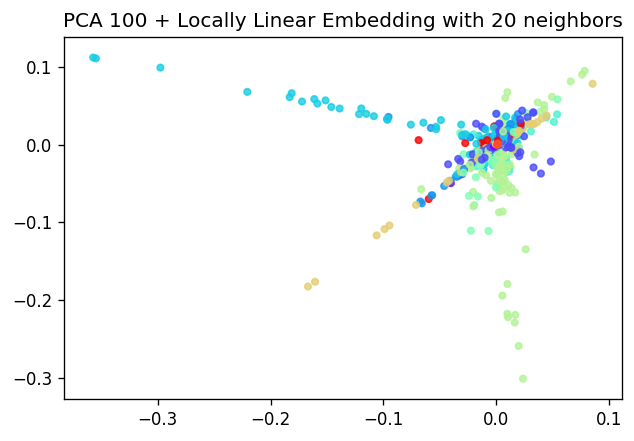

In [105]:
# (3) PCA transformation first, the first 100 principal components as the input to LLE with 20 neighbors

pca_100 = PCA(n_components = 100).fit_transform(dep_stu2)
lle = LocallyLinearEmbedding(n_components = 2, n_neighbors = 20, n_jobs = -1)
lle_pred_dep = lle.fit_transform(pca_100)
draw_plot(lle_pred_dep[:,0], lle_pred_dep[:,1], colname_df['depname'], depColor, title = "PCA 100 + Locally Linear Embedding with 20 neighbors")

- using 20 neighbors和using 40 neighbors的結果看起來蠻類似的，大部分的點都重疊在一起，只有少數幾個點有被區別出來。
- LLE with 100 principle components的表現稍微好一點，可以看見他將各個分類的點延伸出去，在延伸出去的尾端有被區分開來，但可惜的地方是中間仍然有許多點重疊在一起。

### Q2.4 Kernel PCA

In [13]:
from sklearn.decomposition import KernelPCA

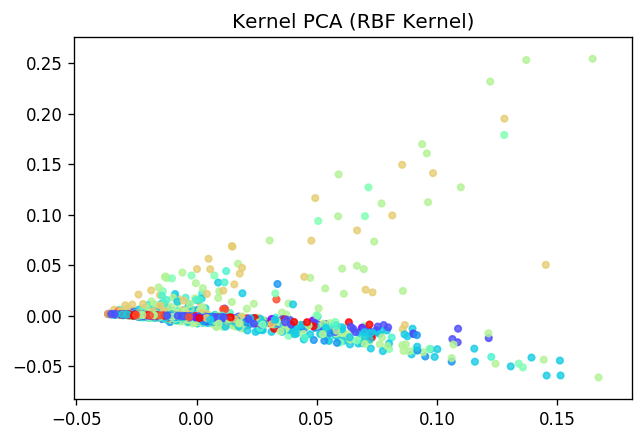

In [17]:
# rbf
rbf_pca= KernelPCA(n_components= 2, kernel = "rbf", gamma = 0.0005)
rbf_dep = rbf_pca.fit_transform(dep_stu2)
draw_plot(rbf_dep[:,0], rbf_dep[:,1], colname_df['depname'], depColor, title = "Kernel PCA (RBF Kernel)")

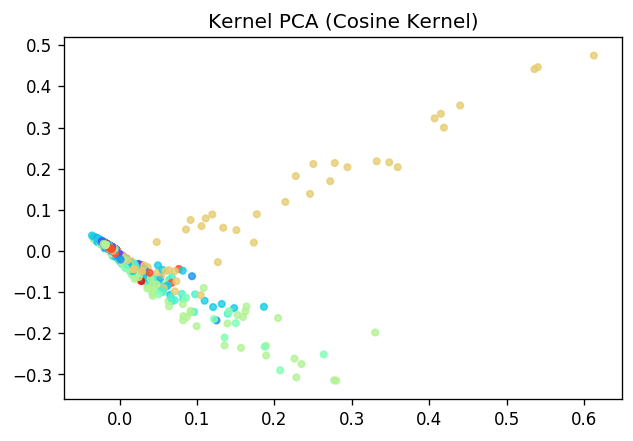

In [19]:
# cosine
cos_pca = KernelPCA(n_components= 2, kernel = "cosine")
cos_dep = cos_pca.fit_transform(dep_stu2)
draw_plot(cos_dep[:,0], cos_dep[:,1], colname_df['depname'], depColor, title = "Kernel PCA (Cosine Kernel)")

- 兩種kernel pca都呈現出有兩條尾巴，然後前端的點都重疊在一起。
- rbf的尾巴相較於cosine的較為混合，cosine的尾巴上半部是醫藥衛生與社會福利、下半部則是工程、製造及營建。

### Q2.5 t-SNE

In [ ]:
from sklearn.manifold import TSNE

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1917 samples in 6.292s...
[t-SNE] Computed neighbors for 1917 samples in 265.045s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1917
[t-SNE] Computed conditional probabilities for sample 1917 / 1917
[t-SNE] Mean sigma: 1.092384
[t-SNE] KL divergence after 250 iterations with early exaggeration: 386.603210
[t-SNE] KL divergence after 1000 iterations: 4.182137


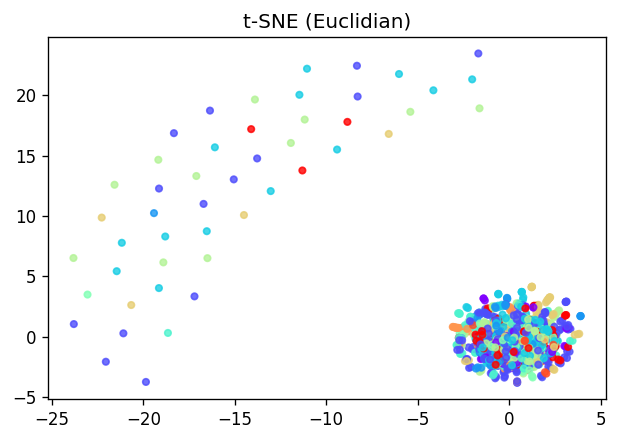

In [23]:
# Euclidian
np.random.seed(100)
tsne_euc = TSNE(n_components=2, early_exaggeration=30, verbose=1, metric = 'euclidean', perplexity=10, learning_rate=15)
euc_dep = tsne_euc.fit_transform(dep_stu2)
draw_plot(euc_dep[:,0], euc_dep[:,1], colname_df['depname'], depColor, title = "t-SNE (Euclidian)")

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1917 samples in 0.057s...
[t-SNE] Computed neighbors for 1917 samples in 2.898s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1917
[t-SNE] Computed conditional probabilities for sample 1917 / 1917
[t-SNE] Mean sigma: 0.186837
[t-SNE] KL divergence after 250 iterations with early exaggeration: 254.718842
[t-SNE] KL divergence after 1000 iterations: 1.335214


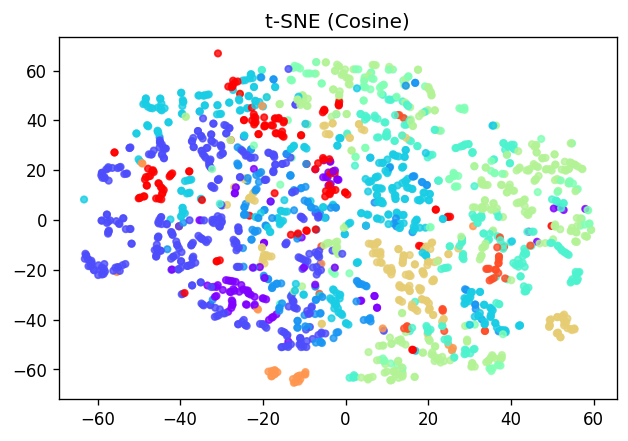

In [25]:
# Cosine
np.random.seed(100)
tsne_cos = TSNE(n_components=2, early_exaggeration=30, verbose=1, metric = 'cosine', perplexity=10, learning_rate=15)
cos_dep = tsne_cos.fit_transform(dep_stu2)
draw_plot(cos_dep[:,0], cos_dep[:,1], colname_df['depname'], depColor, title = "t-SNE (Cosine)")

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1917 samples in 6.905s...
[t-SNE] Computed neighbors for 1917 samples in 221.337s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1917
[t-SNE] Computed conditional probabilities for sample 1917 / 1917
[t-SNE] Mean sigma: 0.141301
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.786987
[t-SNE] KL divergence after 1000 iterations: 1.325049


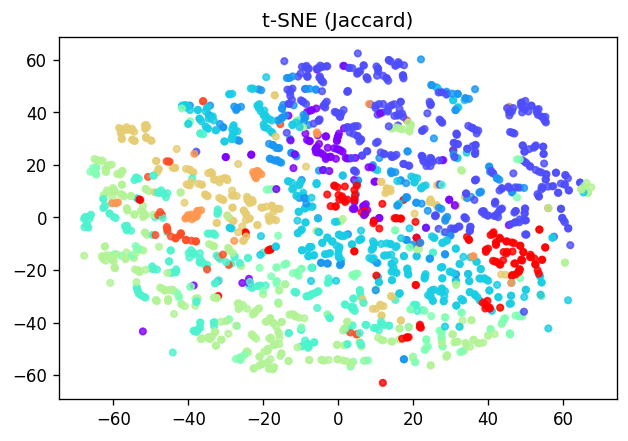

In [27]:
#  Jaccard
tsne_jac = TSNE(n_components=2, metric='jaccard', verbose=1, perplexity=10, learning_rate=15)
jac_dep = tsne_jac.fit_transform(dep_stu2)
draw_plot(jac_dep[:,0], jac_dep[:,1], colname_df['depname'], depColor, title = "t-SNE (Jaccard)")

- 綜合以上三種方法，Jaccard metric的表現結果是最好的，再來是Cosine metric，最差的是Euclidian metric（沒有將不同的類別區分開來）。
- Cosine metric已經有將相同顏色的點集中、與不同的顏色區別開來，而Jaccard metric在不同顏色的區別效果更明顯。

### Q2.6

#### 選擇t-SNE with Jaccard metric

In [40]:
# 處理overlap的問題
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

final_dep = jac_dep.copy()

dist = (1.2 + 0.01) / 1.3

tmp = jac_dep.copy()
tmp[:,0] = tmp[:,0] * 0.5
link = linkage(tmp)
clus_1 = fcluster(link, t = 1.2, criterion = 'distance')

n_c = 0
for i in range(1, np.max(clus_1)+1):
        
        ind = clus_1 == i
        n_point = np.sum(ind)
        if n_point < 2:
            continue
        n_c += 1
        x_0 = final_dep[ind,:]
        cent = np.mean(x_0, axis = 0)

        direct = np.zeros((n_point, 2))
        
        for j in range(n_point):
            direct[j,:] = np.array([0.0, (j - n_point/2) * dist])

        x0_new = cent + direct
        final_dep[ind,:] = x0_new

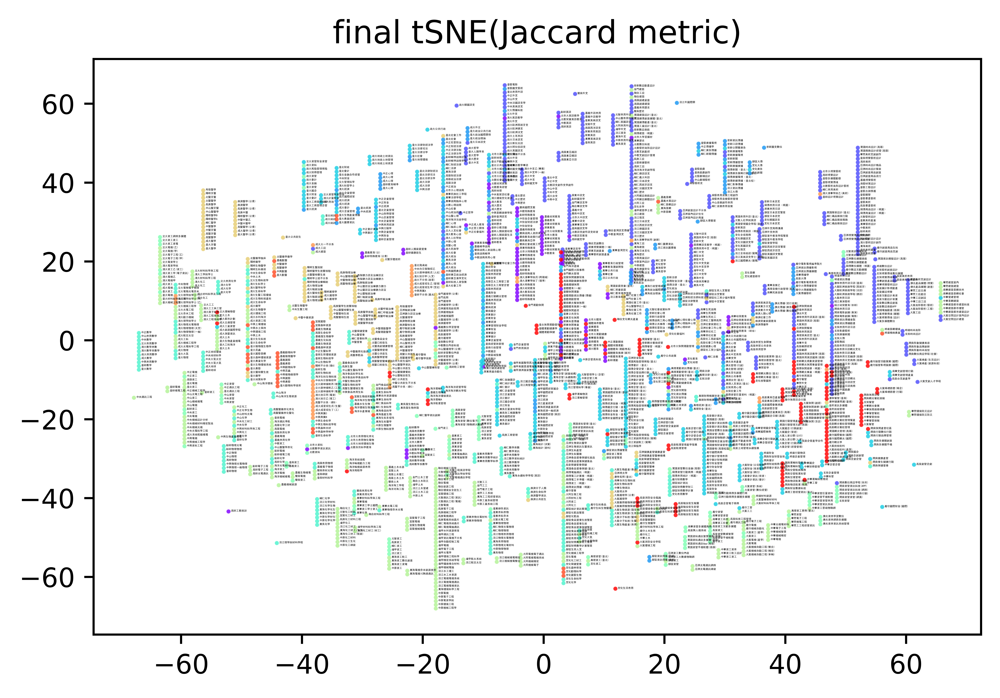

In [41]:
# output the picture to a separate file
 
fig, ax = plt.subplots(dpi = 1250)

ax.set_title('final tSNE(Jaccard metric)')

ax.scatter(final_dep[:,0], final_dep[:,1], s = 0.3, color = depColor, alpha = 0.8)

shift = np.sqrt(0.6) / 2
for i, word in enumerate(colname_df['depname']):
    ax.annotate(word, (final_dep[:,0][i] + shift, final_dep[:,1][i]), size = 1, color = 'black', fontproperties=ChineseFont)

plt.savefig('output.PNG')